In [3]:
from __future__ import print_function
#%matplotlib inline
from collections import OrderedDict

import glob
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
from torch.utils.data import Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torchvision.io
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import torch.nn.functional as F
import pytorch_lightning as pl
from src.models.model import CycleGAN
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [4]:
# Root directory for dataset
dataroot = "../data/raw/"
# Number of workers for dataloader
workers = 12
# Batch size during training
batch_size = 128
# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 256
# Number of GPUs available. Use 0 for CPU mode.
ngpu = 0

In [5]:
class MonetDataset(Dataset):
    def __init__(self,dataroot,transforms=None,shuffle_photos=False):
        super().__init__()
        self.monets = glob.glob(dataroot+"monet_jpg/*.jpg")
        if shuffle_photos:
            random.shuffle(self.photos)
        self.photos = glob.glob(dataroot+"photo_jpg/*.jpg")[:len(self.monets)]
        self.transforms = transforms

    def __getitem__(self, idx):
        monet = torchvision.io.read_image(self.monets[idx]).to(torch.float)
        photo = torchvision.io.read_image(self.photos[idx]).to(torch.float)
        if self.transforms:
            monet = self.transforms(monet)
            photo = self.transforms(photo)
        return monet,photo

    def __len__(self):
        return len(self.monets)

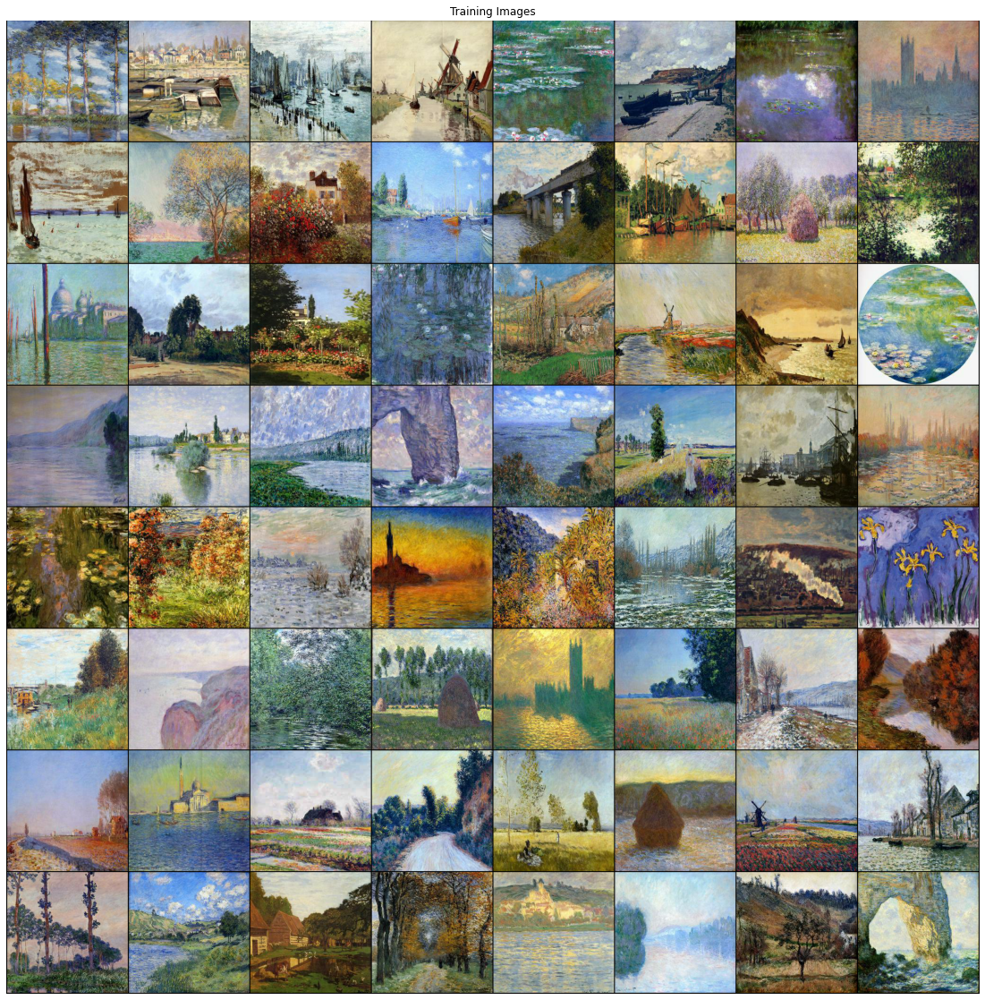

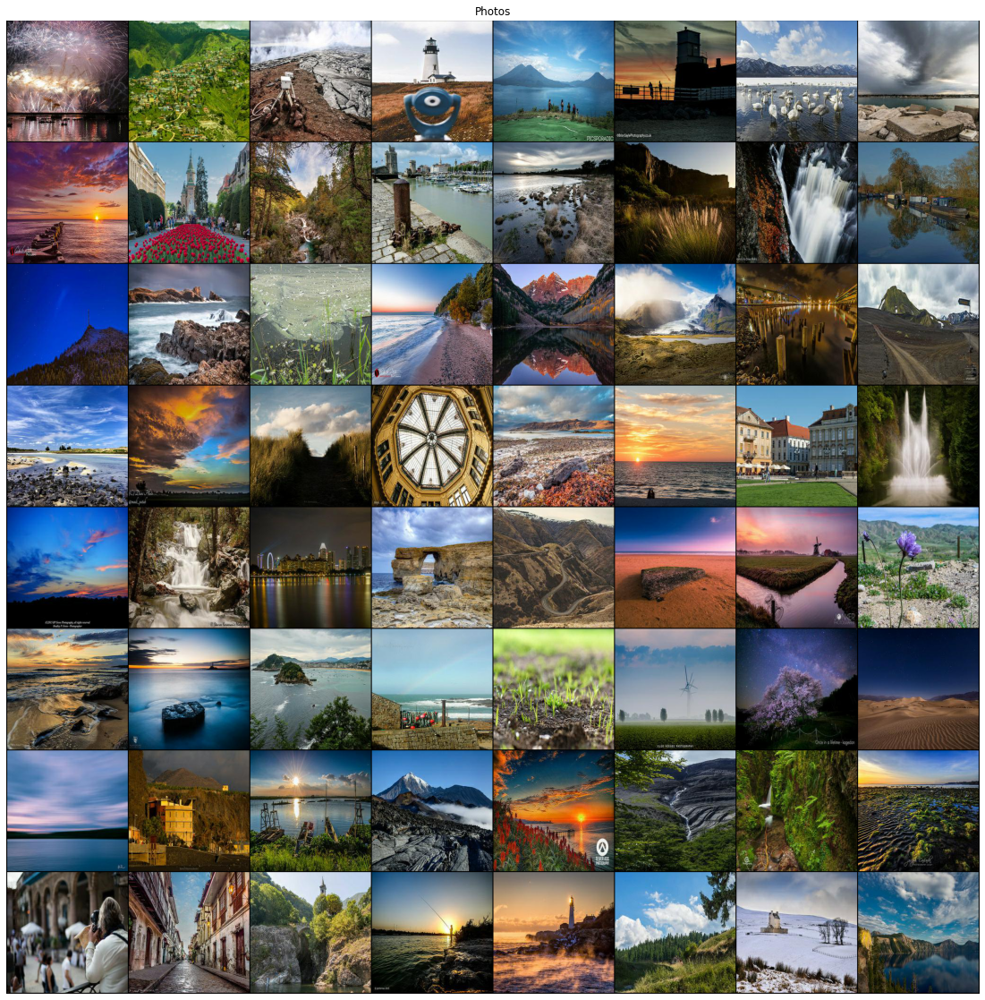

In [23]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = MonetDataset(dataroot=dataroot,
                           transforms=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.Normalize(127.5, 127.5),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(20,20))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()
plt.figure(figsize=(20,20))
plt.axis("off")
plt.title("Photos")
plt.imshow(np.transpose(vutils.make_grid(real_batch[1].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [24]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

In [25]:
# Number of channels in the training images. For color images this is 3
nc = 3
# Size of z latent vector (i.e. size of generator input)
nz = 100
# Size of feature maps in generator
ngf = 64
# Size of feature maps in discriminator
ndf = 64
# Number of training epochs
num_epochs = 500
# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

In [26]:
def downsample(in_channels,out_channels, kernel_size, apply_instancenorm=True):
    layer = nn.Sequential()
    layer.add_module("Conv",
                     nn.Conv2d(
                         in_channels=in_channels,
                         out_channels=out_channels,
                         kernel_size=kernel_size,
                         stride=2,
                         padding=0,
                         bias=False))
    if apply_instancenorm:
        layer.add_module("InstanceNorm",
                         nn.InstanceNorm2d(num_features=out_channels))
    layer.add_module("LeakyRelu",nn.LeakyReLU())
    return layer

def upsample(in_channels,out_channels, kernel_size, apply_dropout=False):
    layer = nn.Sequential()
    layer.add_module("Conv",nn.ConvTranspose2d(
                         in_channels=in_channels,
                         out_channels=out_channels,
                         kernel_size=kernel_size,
                         stride=2,
                         padding=0,
                         bias=False))
    layer.add_module("InstanceNorm",nn.InstanceNorm2d(num_features=out_channels))
    if apply_dropout:
        layer.add_module("Dropout",nn.Dropout2d(p=0.5))
    layer.add_module("Relu",nn.ReLU())
    return layer

In [27]:
# Generator Code
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.down_stack = [
            downsample(in_channels=3,out_channels=64,kernel_size=2,apply_instancenorm=False),
            downsample(in_channels=64,out_channels=128,kernel_size=2),
            downsample(in_channels=128,out_channels=256,kernel_size=2),
            downsample(in_channels=256,out_channels=512,kernel_size=2),
            downsample(in_channels=512,out_channels=512,kernel_size=2),
            downsample(in_channels=512,out_channels=512,kernel_size=2),
            downsample(in_channels=512,out_channels=512,kernel_size=2),
            downsample(in_channels=512,out_channels=512,kernel_size=2,apply_instancenorm=False),
        ]
        self.up_stack = [
            upsample(in_channels=512,out_channels=512,kernel_size=2,apply_dropout=True),
            upsample(in_channels=1024,out_channels=512,kernel_size=2,apply_dropout=True),    
            upsample(in_channels=1024,out_channels=512,kernel_size=2,apply_dropout=True),
            upsample(in_channels=1024,out_channels=512,kernel_size=2),
            upsample(in_channels=1024,out_channels=256,kernel_size=2),
            upsample(in_channels=512,out_channels=128,kernel_size=2),
            upsample(in_channels=256,out_channels=64,kernel_size=2)
        ]
        self.last = nn.Sequential(
            nn.ConvTranspose2d(in_channels=128,out_channels=3,kernel_size=2,stride=2),
            nn.Tanh())

    def forward(self, input):
        # Downsampling through the model
        x = input
        skips = []
        for down in self.down_stack:
            #print(x.shape)
            x = down(x)
            skips.append(x)

        skips = reversed(skips[:-1])

        # Upsampling and establishing the skip connections
        for up, skip in zip(self.up_stack, skips):
            
            x = up(x)
            #print("BEF=",x.shape,skip.shape)
            x = torch.cat((x,skip),dim=1)
            #print("AFT=",x.shape)

        x = self.last(x)

        return x

In [28]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.layers = nn.Sequential(
            downsample(in_channels=3,out_channels=64,kernel_size=2,apply_instancenorm=False),
            downsample(in_channels=64,out_channels=128,kernel_size=2,apply_instancenorm=False),
            downsample(in_channels=128,out_channels=256,kernel_size=2,apply_instancenorm=False),
            nn.ZeroPad2d(1),
            nn.Conv2d(in_channels=256,out_channels=512,kernel_size=4,stride=1,bias=False),
            nn.InstanceNorm2d(num_features=512),
            nn.LeakyReLU(),
            nn.ZeroPad2d(1),
            nn.Conv2d(in_channels=512,out_channels=1,kernel_size=4,stride=1)
        )

    def forward(self, input):
        return self.layers(input)

In [29]:
# Create the generator
monet_generator = Generator(ngpu).to(device)
monet_generator.apply(weights_init)
photo_generator = Generator(ngpu).to(device)
photo_generator.apply(weights_init)

Generator(
  (last): Sequential(
    (0): ConvTranspose2d(128, 3, kernel_size=(2, 2), stride=(2, 2))
    (1): Tanh()
  )
)

In [30]:
monet_discriminator = Discriminator(ngpu).to(device)
monet_discriminator.apply(weights_init)
photo_discriminator = Discriminator(ngpu).to(device)
photo_discriminator.apply(weights_init)

Discriminator(
  (layers): Sequential(
    (0): Sequential(
      (Conv): Conv2d(3, 64, kernel_size=(2, 2), stride=(2, 2), bias=False)
      (LeakyRelu): LeakyReLU(negative_slope=0.01)
    )
    (1): Sequential(
      (Conv): Conv2d(64, 128, kernel_size=(2, 2), stride=(2, 2), bias=False)
      (LeakyRelu): LeakyReLU(negative_slope=0.01)
    )
    (2): Sequential(
      (Conv): Conv2d(128, 256, kernel_size=(2, 2), stride=(2, 2), bias=False)
      (LeakyRelu): LeakyReLU(negative_slope=0.01)
    )
    (3): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
    (4): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (5): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (6): LeakyReLU(negative_slope=0.01)
    (7): ZeroPad2d(padding=(1, 1, 1, 1), value=0.0)
    (8): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1))
  )
)

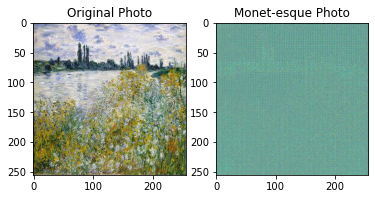

In [32]:
example_photo = next(iter(dataloader))[0][0:1]
to_monet = monet_generator(example_photo)

plt.subplot(1, 2, 1)
plt.title("Original Photo")
plt.imshow(example_photo[0].permute(1,2,0) * 0.5 + 0.5)

plt.subplot(1, 2, 2)
plt.title("Monet-esque Photo")
plt.imshow(to_monet[0].permute(1,2,0).detach().numpy() * 0.5 + 0.5)
plt.show()

In [46]:
from ..src.models.model import CycleGAN

ImportError: attempted relative import with no known parent package

In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [ ]:
x = torch.randn(64,3,256,256).to("cuda:0")
y = netD(x)
y.shape

torch.Size([64, 1, 1, 1])

In [ ]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
num_epochs = 1000
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/1000][0/3]	Loss_D: 1.6201	Loss_G: 2.7192	D(x): 0.3756	D(G(z)): 0.3693 / 0.0726
[1/1000][0/3]	Loss_D: 0.5989	Loss_G: 4.3311	D(x): 0.7787	D(G(z)): 0.2455 / 0.0169
[2/1000][0/3]	Loss_D: 0.5897	Loss_G: 4.9266	D(x): 0.8553	D(G(z)): 0.3045 / 0.0099
[3/1000][0/3]	Loss_D: 0.4874	Loss_G: 5.7443	D(x): 0.8550	D(G(z)): 0.2285 / 0.0042
[4/1000][0/3]	Loss_D: 0.3352	Loss_G: 6.4024	D(x): 0.8708	D(G(z)): 0.1602 / 0.0021
[5/1000][0/3]	Loss_D: 0.3761	Loss_G: 7.4329	D(x): 0.8967	D(G(z)): 0.2073 / 0.0007
[6/1000][0/3]	Loss_D: 0.1979	Loss_G: 7.3086	D(x): 0.9186	D(G(z)): 0.1020 / 0.0008
[7/1000][0/3]	Loss_D: 0.3127	Loss_G: 8.9890	D(x): 0.9274	D(G(z)): 0.1988 / 0.0002
[8/1000][0/3]	Loss_D: 0.1510	Loss_G: 7.8430	D(x): 0.9212	D(G(z)): 0.0576 / 0.0005
[9/1000][0/3]	Loss_D: 0.2054	Loss_G: 8.5170	D(x): 0.9350	D(G(z)): 0.1218 / 0.0002
[10/1000][0/3]	Loss_D: 0.0997	Loss_G: 8.1894	D(x): 0.9546	D(G(z)): 0.0500 / 0.0003
[11/1000][0/3]	Loss_D: 0.0669	Loss_G: 6.6972	D(x): 0.9528	D(G(z)): 0.01

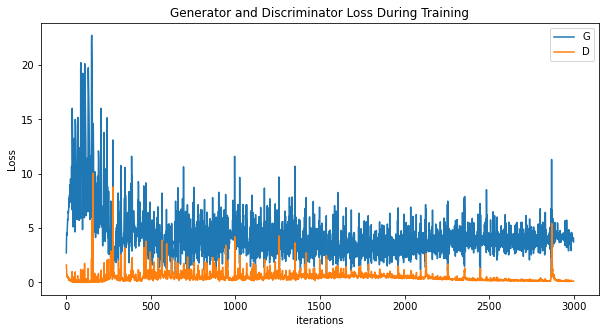

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()


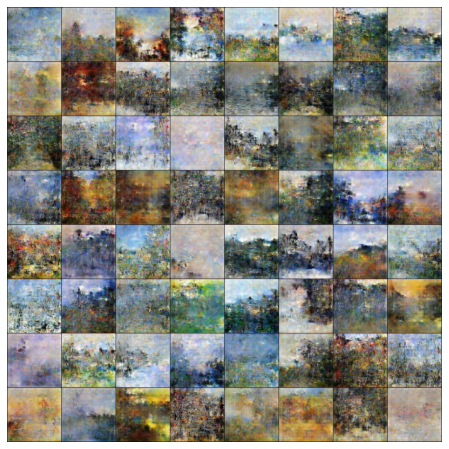

In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

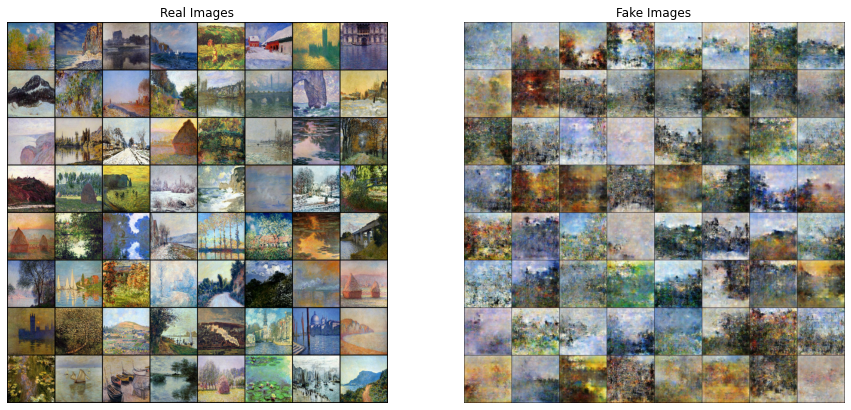

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()